In [34]:
import numpy as np
import matplotlib.pyplot as plt
from gurobipy import Model, GRB, quicksum
from scipy import stats
import matplotlib.pyplot as plt

In [35]:
def gurobi_SSKP(sample_k, r, c, q):
    # input:
    # sample_k (weight matrix): 2d numpy array of shape (k, m), where m is the number of items, k is the number of samples
    # r (reward vector): 1d numpy array of shape (m, )
    # c (cost vector): scalar
    # q (budget): scalar
    # output: 
    # x (selection vector): 1d numpy array of shape (m, )
    k, m = sample_k.shape
    model = Model("SSKP")
    x = model.addVars(m, vtype=GRB.BINARY, name="x")
    z = model.addVars(k, lb=0, vtype=GRB.CONTINUOUS, name="z")

    model.setObjective(sum(r[i] * x[i] for i in range(m)) - c/k * sum(z[j] for j in range(k)), GRB.MAXIMIZE)

    for j in range(k):
        model.addConstr(z[j] >= sum(sample_k[j, i] * x[i] for i in range(m)) - q, f"budget_{j}")

    model.optimize()

    if model.status == GRB.OPTIMAL:
        x_opt = np.array([x[i].X for i in range(m)])
        z_opt = np.array([z[j].X for j in range(k)])
        return x_opt
    else:
        print("No optimal solution found.")
        return None



In [36]:
def gurobi_network_Q(C, sample_Q_sp, sample_Q_pc, D, S, R, M):
    # input:
    # C (unit cost for building a facility): p*1 numpy array
    # sample_Q_sp (unit flow cost): s*p*g*k numpy array
    # sample_Q_pc (unit flow cost): p*c*g*k numpy array
    # D (demand): c*g*k numpy array
    # S (supply): s*g numpy array
    # R (unit processing require): p*g numpy array
    # M (processing capacity): p*1 numpy array
    # output:
    # x (open facility): p*1 numpy array
    # y_sp (flow supplier --> facility): s*p*g numpy array
    # y_pc (flow facility --> consumer): p*c*g numpy array
    s, p, g, k = sample_Q_sp.shape
    c, g = D.shape
    model = Model("network")
    x = model.addVars(p, vtype=GRB.BINARY, name="x")
    y_sp = model.addVars(s, p, g, lb=0, vtype=GRB.CONTINUOUS, name="y_sp")
    y_pc = model.addVars(p, c, g, lb=0, vtype=GRB.CONTINUOUS, name="y_pc")

    model.setObjective(sum(C[j] * x[j] for j in range(p)) \
                       + 1/k * sum(sample_Q_sp[i, j, l, a] * y_sp[i, j, l] for i in range(s) for j in range(p) for l in range(g) for a in range(k))\
                        + 1/k * sum(sample_Q_pc[j, i, l, a] * y_pc[j, i, l] for j in range(p) for i in range(c) for l in range(g) for a in range(k)), GRB.MINIMIZE)
    
    for l in range(g):
        for j in range(p):
            model.addConstr(sum(y_sp[i, j, l] for i in range(s)) - sum(y_pc[j, i, l] for i in range(c)) == 0, f"flow_{j}_{l}")
        for i in range(c):
            model.addConstr(sum(y_pc[j, i, l] for j in range(p)) >= D[i, l], f"demand_{i}_{l}")
        for i in range(s):
            model.addConstr(sum(y_sp[i, j, l] for j in range(p)) <= S[i, l], f"supply_{i}_{l}")
    
    for j in range(p):
        model.addConstr(sum(R[j, l] * (sum(y_sp[i, j, l] for i in range(s))) for l in range(g)) <= M[j] * x[j], f"capacity_{j}")

    model.optimize()

    if model.status == GRB.OPTIMAL:
        x_opt = np.array([x[i].X for i in range(p)])
        y_sp_opt = np.array([[[y_sp[i, j, l].X for i in range(s)] for j in range(p)] for l in range(g)])
        y_pc_opt = np.array([[[y_pc[j, i, l].X for i in range(c)] for j in range(p)] for l in range(g)])
        return x_opt, y_sp_opt, y_sp_opt
    else:
        print("No optimal solution found.")
        return None
    

In [37]:
def gurobi_network(C, Q_sp, Q_pc, sample_D, sample_S, R, M, H):
    # input:
    # C (unit cost for building a facility): p*1 numpy array
    # Q_sp (unit flow cost): s*p*g numpy array
    # Q_pc (unit flow cost): p*c*g numpy array
    # sample_D (demand): c*g*k numpy array
    # sample_S (supply): s*g*k numpy array
    # R (unit processing require): p*g numpy array
    # M (processing capacity): p*1 numpy array
    # H (multiplier): c*g numpy array
    # output:
    # x (open facility): p*1 numpy array
    # y_sp (flow supplier --> facility): s*p*g numpy array
    # y_pc (flow facility --> consumer): p*c*g numpy array
    s, p, g = Q_sp.shape
    c, g, k = sample_D.shape
    model = Model("network")
    x = model.addVars(p, vtype=GRB.BINARY, name="x")
    y_sp = model.addVars(s, p, g, k, lb=0, vtype=GRB.CONTINUOUS, name="y_sp")
    y_pc = model.addVars(p, c, g, k, lb=0, vtype=GRB.CONTINUOUS, name="y_pc")
    z = model.addVars(c, g, k, lb=0, vtype=GRB.CONTINUOUS, name="z")

    model.setObjective(sum(C[j] * x[j] for j in range(p)) \
                       + 1/k * sum(Q_sp[i, j, l] * y_sp[i, j, l, a] for i in range(s) for j in range(p) for l in range(g) for a in range(k))\
                        + 1/k * sum(Q_pc[j, i, l] * y_pc[j, i, l, a] for j in range(p) for i in range(c) for l in range(g) for a in range(k))\
                            + 1/k * sum(H[i, l] * z[i, l, a] for i in range(c) for l in range(g) for a in range(k)), GRB.MINIMIZE)
    for a in range(k):
        for l in range(g):
            for j in range(p):
                model.addConstr(sum(y_sp[i, j, l, a] for i in range(s)) - sum(y_pc[j, i, l, a] for i in range(c)) == 0, f"flow_{j}_{l}")
            for i in range(c):
                model.addConstr(sum(y_pc[j, i, l, a] + z[i, l, a] for j in range(p)) >= sample_D[i, l, a], f"demand_{i}_{l}")
            for i in range(s):
                model.addConstr(sum(y_sp[i, j, l, a] for j in range(p)) <= sample_S[i, l, a], f"supply_{i}_{l}")
        for j in range(p):
            model.addConstr(sum(R[j, l] * (sum(y_sp[i, j, l, a] for i in range(s))) for l in range(g)) <= M[j] * x[j], f"capacity_{j}")

    model.optimize()

    if model.status == GRB.OPTIMAL:
        x_opt = np.array([x[i].X for i in range(p)])
        y_sp_opt = np.array([[[y_sp[i, j, l, a].X for i in range(s)] for j in range(p)] for l in range(g) for a in range(k)])
        y_pc_opt = np.array([[[y_pc[j, i, l, a].X for i in range(c)] for j in range(p)] for l in range(g) for a in range(k)])
        z_opt = np.array([[[z[i, l, a].X for i in range(c)] for l in range(g)] for a in range(k)])
        return x_opt, y_sp_opt, y_pc_opt, z_opt
    else:
        print("No optimal solution found.")
        return None
    

In [38]:
def sample_func(distribution_name, **dist_params):
     if hasattr(np.random, distribution_name):
        # Access the distribution function dynamically
        dist_func = getattr(np.random, distribution_name)
        # Generate samples
        samples = dist_func(**dist_params)
        return samples
     else:
        raise ValueError(f"Unsupported distribution: {distribution_name}")

In [39]:
def majority_vote(sample_n, B, k, eval_func, *eval_args):
    x_count = {}
    for b in range(B):
        # choose k samples from total n samples
        sample_k = sample_n[np.random.choice(sample_n.shape[0], k, replace=False)]
        x_k = tuple(eval_func(sample_k, *eval_args))
        x_count[x_k] = x_count.get(x_k, 0) + 1
    
    x_max = max(x_count, key=x_count.get)
    return x_max

In [40]:
def optimal_eval(sample, x, y_sp, y_pc, z, C, Q_sp, Q_pc, H):
     # sample: large numer * m matrix
     expected_cost = 0
     for w in sample:
          expected_cost += max(sum(w[i] * x[i] for i in range(len(x)))-q, 0)
     expected_cost = expected_cost/len(sample)
     opt = sum(r[i] * x[i] for i in range(len(x))) - c * expected_cost
     return opt

In [41]:
# Pareto distribution comparison between SAA and majority vote
s = 3 # numbe of suppliers
p = 5 # number of facilities
c = 3 # number of consumers
g = 4 # number of proucts
k = 1 # number of samples

# Randomly generate input parameters based on the given dimensions
C = np.random.rand(p)           # Unit cost for building a facility
Q_sp = np.random.rand(s, p, g)  # Unit flow cost from supplier to facility
Q_pc = np.random.rand(p, c, g)  # Unit flow cost from facility to customer
R = np.random.rand(p, g)        # Unit processing requirement
M = np.random.rand(p)           # Processing capacity
H = np.random.rand(c, g) + 10        # Multiplier

sample_D = sample_func('pareto', size=(s,g,k), a=2.8)  # Unit flow cost from supplier to facility
sample_S = sample_func('pareto', size=(c,g,k), a=2.8)  # Unit flow cost from facility to customer

x, y_sp, y_pc = gurobi_network(C, Q_sp, Q_pc, sample_D, sample_S, R, M, H)
print(x)
print(y_sp, y_pc)

Gurobi Optimizer version 11.0.0 build v11.0.0rc2 (mac64[arm] - Darwin 21.3.0 21D62)

CPU model: Apple M1 Pro
Thread count: 10 physical cores, 10 logical processors, using up to 10 threads

Optimize a model with 49 rows, 137 columns and 317 nonzeros
Model fingerprint: 0xb6d9b3de
Variable types: 132 continuous, 5 integer (5 binary)
Coefficient statistics:
  Matrix range     [2e-02, 5e+00]
  Objective range  [1e-04, 1e+01]
  Bounds range     [1e+00, 1e+00]
  RHS range        [4e-02, 1e+00]
Found heuristic solution: objective 2.531969e+11
Presolve time: 0.00s
Presolved: 49 rows, 137 columns, 317 nonzeros
Found heuristic solution: objective 9.4891168
Variable types: 132 continuous, 5 integer (5 binary)

Root relaxation: objective 6.276812e+00, 75 iterations, 0.00 seconds (0.00 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     0     0    6.27681    0    4    9.48912    6.276

ValueError: too many values to unpack (expected 3)

In [ ]:
# Pareto distribution comparison between SAA and majority vote
m = 3 # Number of items
c = 5 # Cost 
q = 1 # Budget
r = np.random.uniform(3, 4, size=m) # Rewards
a_ls = np.full(m, 2) #np.random.rand(m)+1 # Pareto distribution parameter

# Generate samples for evaluation of optimal SAA and majority vote
large_number_sample = 10000 
arrays_list = []
for i in range(m):
    arrays_list.append(sample_func('pareto', size=large_number_sample, a=a_ls[i]))
    larger_sample = np.vstack(arrays_list).T

NameError: name 'sample_func' is not defined

Gurobi Optimizer version 11.0.0 build v11.0.0rc2 (mac64[arm] - Darwin 21.3.0 21D62)

CPU model: Apple M1 Pro
Thread count: 10 physical cores, 10 logical processors, using up to 10 threads

Optimize a model with 1000 rows, 1003 columns and 4000 nonzeros
Model fingerprint: 0x9052bd68
Variable types: 1000 continuous, 3 integer (3 binary)
Coefficient statistics:
  Matrix range     [1e-05, 2e+02]
  Objective range  [5e-03, 4e+00]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 1e+00]
Found heuristic solution: objective -0.0000000
Presolve removed 256 rows and 255 columns
Presolve time: 0.00s
Presolved: 744 rows, 748 columns, 2977 nonzeros
Variable types: 745 continuous, 3 integer (3 binary)
Found heuristic solution: objective 1.6999748

Root relaxation: objective 1.875849e+00, 246 iterations, 0.00 seconds (0.00 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/Node Time

     

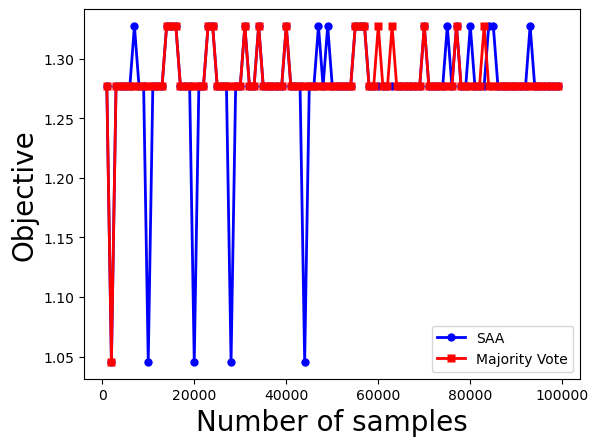

In [ ]:
SAA_list = []
SAA_obj_list = []
majority_list = []
majority_obj_list = []
sample_number = np.arange(1000, 100000, 1000)
for ite in sample_number:
    arrays_list = []
    n = ite
    for i in range(m):
        arrays_list.append(sample_func('pareto', size=n, a=a_ls[i]))
        sample_n = np.vstack(arrays_list).T
    SAA = majority_vote(sample_n, 1, n, gurobi_SSKP, r,c,q)
    SAA_list.append(SAA)
    SAA_obj = optimal_eval(larger_sample, SAA, r, c, q)
    SAA_obj_list.append(SAA_obj)

    majority = majority_vote(sample_n, 100, int(n/10), gurobi_SSKP, r,c,q)
    majority_list.append(majority)
    majority_obj = optimal_eval(larger_sample, majority, r, c, q)
    majority_obj_list.append(majority_obj)

fig2, ax2 = plt.subplots()
ax2.plot(sample_number, SAA_obj_list, marker = 'o', markeredgecolor = 'none', color = 'blue',linestyle = 'solid', linewidth = 2, label = 'SAA')
ax2.plot(sample_number, majority_obj_list, marker = 's', markeredgecolor = 'none', color = 'red',linestyle = 'solid', linewidth = 2, label = 'Majority Vote')
ax2.set_xlabel('Number of samples', size = 20)
ax2.set_ylabel('Objective', size = 20)
ax2.legend(loc = 'lower right')
plt.show()

In [ ]:
print(SAA_list)
print(majority_list)
print(SAA_obj_list)
print(majority_obj_list)

[(0.0, 1.0, 1.0), (0.0, 1.0, 0.0), (-0.0, 1.0, 1.0), (0.0, 1.0, 1.0), (-0.0, 1.0, 1.0), (0.0, 1.0, 1.0), (-0.0, -0.0, 1.0), (0.0, 1.0, 1.0), (0.0, 1.0, 1.0), (-0.0, 1.0, -0.0), (0.0, 1.0, 1.0), (0.0, 1.0, 1.0), (0.0, 1.0, 1.0), (-0.0, -0.0, 1.0), (0.0, 0.0, 1.0), (-0.0, -0.0, 1.0), (0.0, 1.0, 1.0), (0.0, 1.0, 1.0), (0.0, 1.0, 1.0), (-0.0, 1.0, -0.0), (0.0, 1.0, 1.0), (0.0, 1.0, 1.0), (-0.0, -0.0, 1.0), (0.0, 0.0, 1.0), (0.0, 1.0, 1.0), (0.0, 1.0, 1.0), (0.0, 1.0, 1.0), (0.0, 1.0, 0.0), (0.0, 1.0, 1.0), (0.0, 1.0, 1.0), (-0.0, -0.0, 1.0), (0.0, 1.0, 1.0), (0.0, 1.0, 1.0), (-0.0, -0.0, 1.0), (0.0, 1.0, 1.0), (0.0, 1.0, 1.0), (0.0, 1.0, 1.0), (0.0, 1.0, 1.0), (0.0, 1.0, 1.0), (-0.0, -0.0, 1.0), (0.0, 1.0, 1.0), (0.0, 1.0, 1.0), (0.0, 1.0, 1.0), (-0.0, 1.0, -0.0), (0.0, 1.0, 1.0), (0.0, 1.0, 1.0), (-0.0, -0.0, 1.0), (0.0, 1.0, 1.0), (0.0, 0.0, 1.0), (0.0, 1.0, 1.0), (0.0, 1.0, 1.0), (0.0, 1.0, 1.0), (0.0, 1.0, 1.0), (0.0, 1.0, 1.0), (-0.0, -0.0, 1.0), (-0.0, -0.0, 1.0), (0.0, 0.0, 1.0), (0

In [ ]:
# normal distribution comparison between SAA and majority vote
def u(x, u, q):
    return sum(u_i * x_i for u_i, x_i in zip(u, x)) - q

def var(x,std):
    return sum(std_i**2 * x_i**2 for std_i, x_i in zip(std, x))

def phi(x):
    return stats.norm.cdf(x, loc=0, scale=1)

def g(x, r, c, q, avg, std):
    expect_obj = sum(r_i * x_i for r_i, x_i in zip(r, x)) \
        - c * (u(x,avg,q) * phi(u(x,avg,q)/np.sqrt(var(x,std))) \
               + np.sqrt(var(x,std)/(2*np.pi)) * np.exp(-u(x,avg,q)**2/(2*var(x,std))))
    return expect_obj

m = 3 # Number of items
c = 5 # Cost 
q = 10 # Budget
r = np.random.uniform(3, 4, size=m) # Rewards

# generate n samples with iid normal distribution
avg =  np.random.randint(1, 5, size=m)
std =  np.random.randint(10, 20, size=m)


SAA_list_normal = []
SAA_obj_list_normal = []
majority_list_normal = []
majority_obj_list_normal = []
sample_number = np.arange(20, 1050, 50)
for ite in sample_number:
    arrays_list = []
    n = ite
    for i in range(m):
        arrays_list.append(sample_func('normal', size=n, loc=avg[i], scale=std[i]))
        sample_n = np.vstack(arrays_list).T
    SAA = majority_vote(sample_n, 1, n, gurobi_SSKP, r,c,q)
    SAA_list_normal.append(SAA)
    SAA_obj = g(SAA, r, c, q, avg, std)
    SAA_obj_list_normal.append(SAA_obj)

    majority = majority_vote(sample_n, 40, int(n/10), gurobi_SSKP, r,c,q)
    majority_list_normal.append(majority)
    majority_obj = g(majority, r, c, q, avg, std)
    majority_obj_list_normal.append(majority_obj)

fig1, ax1 = plt.subplots()
ax1.plot(sample_number, SAA_obj_list_normal, marker = 'o', markeredgecolor = 'none', color = 'blue',linestyle = 'solid', linewidth = 2, label = 'SAA')
ax1.plot(sample_number, majority_obj_list_normal, marker = 's', markeredgecolor = 'none', color = 'red',linestyle = 'solid', linewidth = 2, label = 'Majority Vote')
ax1.set_xlabel('Number of samples', size = 20)
ax1.set_ylabel('Objective', size = 20)
ax1.legend(loc = 'lower right')
plt.show()

In [ ]:
print(SAA_list_normal)
print(majority_list_normal)
print(SAA_obj_list_normal)
print(majority_obj_list_normal)